In [1]:
# Standard Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string
import warnings
warnings.filterwarnings('ignore')

# NLP & Preprocessing
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Machine Learning
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (classification_report, confusion_matrix, 
                            accuracy_score, precision_recall_fscore_support)
from sklearn.metrics import ConfusionMatrixDisplay

# Deep Learning & Transformers
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torch.optim import AdamW
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# Transformers-specific
from transformers import (BertTokenizer, BertModel,
                         BertTokenizerFast, BertForSequenceClassification,
                         DistilBertTokenizerFast, DistilBertForSequenceClassification,
                         RobertaTokenizerFast, RobertaForSequenceClassification,
                         Trainer, TrainingArguments)

# Dataset Handling
from datasets import Dataset

# Explainability
import shap
import eli5
from eli5 import show_weights, explain_weights
import lime
from lime.lime_text import LimeTextExplainer

### 2: Data Loading & Preprocessing

In [3]:
# Load datasets
df_fake = pd.read_csv('Fake.csv')
df_true = pd.read_csv('True.csv')

# Tag the labels
df_fake['label'] = 0
df_true['label'] = 1

# Filter by political vs non-political
fake_political = df_fake[df_fake['subject'].str.lower() == 'politics']
fake_nonpolitical = df_fake[df_fake['subject'].str.lower() != 'politics']

true_political = df_true[df_true['subject'].str.lower() == 'politicsnews']
true_nonpolitical = df_true[df_true['subject'].str.lower() != 'politicsnews']

# Combine into political and non-political datasets
df_political = pd.concat([fake_political, true_political], ignore_index=True)
df_nonpolitical = pd.concat([fake_nonpolitical, true_nonpolitical], ignore_index=True)

# Shuffle them to avoid ordering bias
df_political = df_political.sample(frac=1, random_state=42).reset_index(drop=True)
df_nonpolitical = df_nonpolitical.sample(frac=1, random_state=42).reset_index(drop=True)

df_political.to_csv("ISOT_political.csv", index=False)
df_nonpolitical.to_csv("ISOT_nonpolitical.csv", index=False)

print(" Datasets divided and saved.")
print(f"Political set size: {len(df_political)}")
print(f"Non-political set size: {len(df_nonpolitical)}")

 Datasets divided and saved.
Political set size: 18113
Non-political set size: 26785


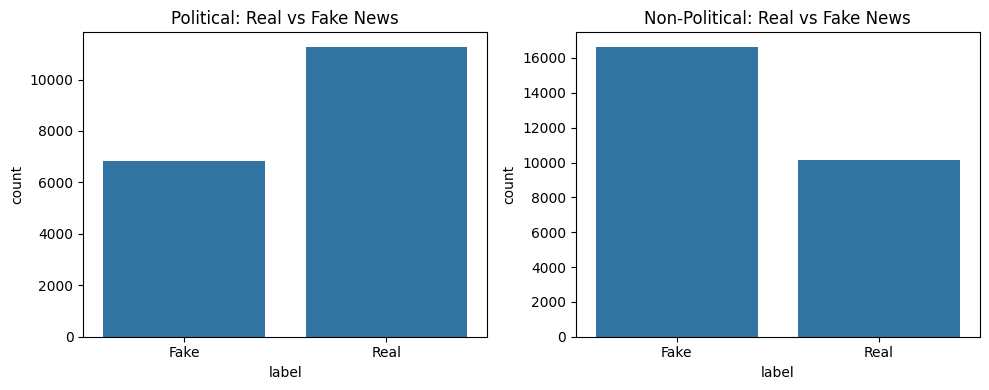

In [ ]:
# Load already-split datasets
df_political = pd.read_csv("ISOT_political.csv")
df_nonpolitical = pd.read_csv("ISOT_nonpolitical.csv")

# Combine title + text into a new 'content' column
def combine_and_clean(df):
    df['content'] = df['title'] + " " + df['text']
    df = df.drop(columns=['title', 'text'])

    # Define cleansing function
    def clean_text(text):
        text = text.lower()
        text = re.sub(r'\[.*?\]', '', text)
        text = re.sub(r'http\S+', '', text)
        text = re.sub(r'<.*?>+', '', text)
        text = re.sub(r'[%s]' % re.escape(string.punctuation), '', text)
        text = re.sub(r'\n', '', text)
        text = re.sub(r'["\'`]', '', text)
        text = re.sub(r'\w*\d\w*', '', text)
        text = re.sub(r'^[A-Z\s]{2,}(?:\(\w+\))?\s*-+\s*', '', text)  # headers like WASHINGTON (Reuters)
        text = re.sub(r'\b\(Reuters\)|Reuters\b', '', text, flags=re.IGNORECASE)  # remove inline Reuters
        text = re.sub(r'\s+', ' ', text)
        return text

    df['cleaned'] = df['content'].apply(clean_text)
    return df

# Clean both datasets
df_political_cleaned = combine_and_clean(df_political)
df_nonpolitical_cleaned = combine_and_clean(df_nonpolitical)

df_political_cleaned.to_csv("ISOT_political_cleaned.csv", index=False)
df_nonpolitical_cleaned.to_csv("ISOT_nonpolitical_cleaned.csv", index=False)

# Visualize class distribution for each domain
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.countplot(data=df_political_cleaned, x='label')
plt.title("Political: Real vs Fake News")
plt.xticks([0, 1], ['Fake', 'Real'])
plt.subplot(1, 2, 2)
sns.countplot(data=df_nonpolitical_cleaned, x='label')
plt.title("Non-Political: Real vs Fake News")
plt.xticks([0, 1], ['Fake', 'Real'])
plt.tight_layout()
plt.show()

In [10]:
# Political domain
X_p = df_political_cleaned['cleaned']
y_p = df_political_cleaned['label']

X_p_train, X_p_test, y_p_train, y_p_test = train_test_split(
    X_p, y_p, test_size=0.2, random_state=42, stratify=y_p)

tfidf_p = TfidfVectorizer(max_features=5000, ngram_range=(1, 2), stop_words='english')
X_p_train_tfidf = tfidf_p.fit_transform(X_p_train)
X_p_test_tfidf = tfidf_p.transform(X_p_test)

print("TF-IDF (Political) train shape:", X_p_train_tfidf.shape)

# Non-political domain
X_np = df_nonpolitical_cleaned['cleaned']
y_np = df_nonpolitical_cleaned['label']

X_np_train, X_np_test, y_np_train, y_np_test = train_test_split(
    X_np, y_np, test_size=0.2, random_state=42, stratify=y_np)

tfidf_np = TfidfVectorizer(max_features=5000, ngram_range=(1, 2), stop_words='english')
X_np_train_tfidf = tfidf_np.fit_transform(X_np_train)
X_np_test_tfidf = tfidf_np.transform(X_np_test)

print("TF-IDF (Non-Political) train shape:", X_np_train_tfidf.shape)

TF-IDF (Political) train shape: (14490, 5000)
TF-IDF (Non-Political) train shape: (21428, 5000)


### Traditional Models


========== Political DOMAIN ==========

 Logistic Regression Results
Accuracy: 0.9751587082528291
              precision    recall  f1-score   support

        Fake       0.98      0.96      0.97      1368
        Real       0.97      0.99      0.98      2255

    accuracy                           0.98      3623
   macro avg       0.98      0.97      0.97      3623
weighted avg       0.98      0.98      0.98      3623



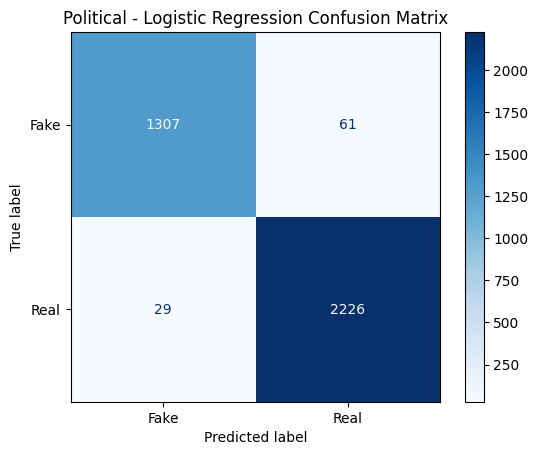


 Random Forest Results
Accuracy: 0.9657742202594535
              precision    recall  f1-score   support

        Fake       0.98      0.92      0.95      1368
        Real       0.96      0.99      0.97      2255

    accuracy                           0.97      3623
   macro avg       0.97      0.96      0.96      3623
weighted avg       0.97      0.97      0.97      3623



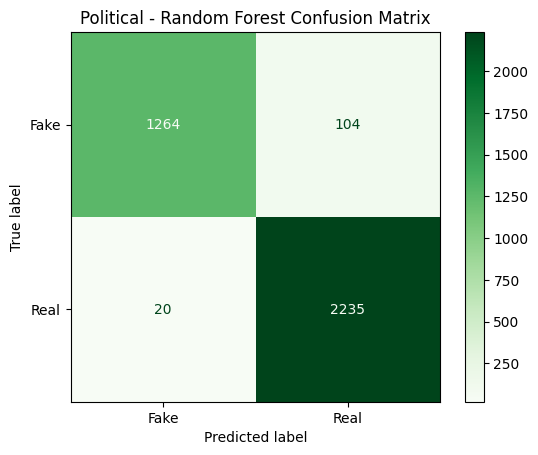


========== Non-Political DOMAIN ==========

 Logistic Regression Results
Accuracy: 0.9904797461265634
              precision    recall  f1-score   support

        Fake       0.99      0.99      0.99      3328
        Real       0.99      0.99      0.99      2029

    accuracy                           0.99      5357
   macro avg       0.99      0.99      0.99      5357
weighted avg       0.99      0.99      0.99      5357



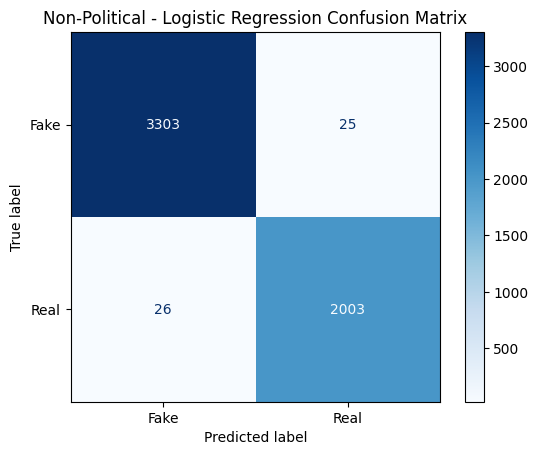


 Random Forest Results
Accuracy: 0.9897330595482546
              precision    recall  f1-score   support

        Fake       0.99      0.99      0.99      3328
        Real       0.99      0.99      0.99      2029

    accuracy                           0.99      5357
   macro avg       0.99      0.99      0.99      5357
weighted avg       0.99      0.99      0.99      5357



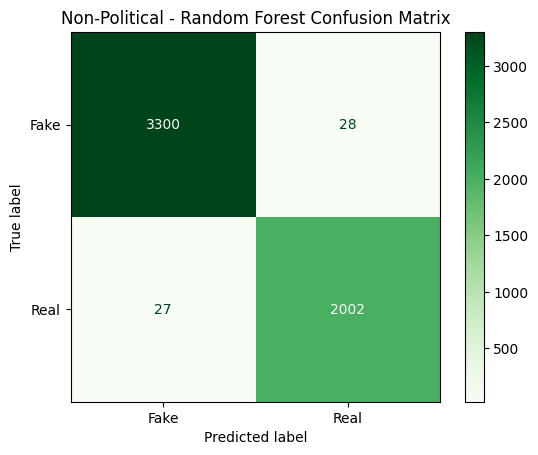

In [101]:
def evaluate_models(X_train_tfidf, X_test_tfidf, y_train, y_test, domain_name=""):
    print(f"\n========== {domain_name} DOMAIN ==========")

    # LOGISTIC REGRESSION
    print("\n Logistic Regression Results")
    lr_model = LogisticRegression(max_iter=1000)
    lr_model.fit(X_train_tfidf, y_train)
    y_pred_lr = lr_model.predict(X_test_tfidf)

    print("Accuracy:", accuracy_score(y_test, y_pred_lr))
    print(classification_report(y_test, y_pred_lr, target_names=["Fake", "Real"]))

    cm_lr = confusion_matrix(y_test, y_pred_lr)
    disp_lr = ConfusionMatrixDisplay(confusion_matrix=cm_lr, display_labels=["Fake", "Real"])
    disp_lr.plot(cmap="Blues")
    plt.title(f"{domain_name} - Logistic Regression Confusion Matrix")
    plt.show()

    # RANDOM FOREST
    print("\n Random Forest Results")
    rf_model = RandomForestClassifier(n_estimators=200, max_depth=50, random_state=42)
    rf_model.fit(X_train_tfidf, y_train)
    y_pred_rf = rf_model.predict(X_test_tfidf)

    print("Accuracy:", accuracy_score(y_test, y_pred_rf))
    print(classification_report(y_test, y_pred_rf, target_names=["Fake", "Real"]))

    cm_rf = confusion_matrix(y_test, y_pred_rf)
    disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf, display_labels=["Fake", "Real"])
    disp_rf.plot(cmap="Greens")
    plt.title(f"{domain_name} - Random Forest Confusion Matrix")
    plt.show()

    return lr_model, rf_model
    
# Political domain
lr_model_p, rf_model_p = evaluate_models(X_p_train_tfidf, X_p_test_tfidf, y_p_train, y_p_test, domain_name="Political")

# Non-Political domain
lr_model_np, rf_model_np = evaluate_models(X_np_train_tfidf, X_np_test_tfidf, y_np_train, y_np_test, domain_name="Non-Political")


In [ ]:
import joblib

# Save Logistic Regression models
joblib.dump(lr_model_p, "saved_models/lr_model_p.joblib")
joblib.dump(lr_model_np, "saved_models/lr_model_np.joblib")

# Save Random Forest models
joblib.dump(rf_model_p, "saved_models/rf_model_p.joblib")
joblib.dump(rf_model_np, "saved_models/rf_model_np.joblib")

# Save TF-IDF vectorizers
joblib.dump(tfidf_p, "saved_models/tfidf_vectorizer_p.joblib")
joblib.dump(tfidf_np, "saved_models/tfidf_vectorizer_np.joblib")


['saved_models/tfidf_vectorizer_np.joblib']

### LSTM


================ 🧬 Political DOMAIN: LSTM ==================
Shape of padded training data: (14490, 300)
Epoch 1/5
114/114 ━━━━━━━━━━━━━━━━━━━━ 46s 383ms/step - accuracy: 0.6194 - loss: 0.6443 - val_accuracy: 0.7149 - val_loss: 0.4566
Epoch 2/5
114/114 ━━━━━━━━━━━━━━━━━━━━ 45s 397ms/step - accuracy: 0.7208 - loss: 0.4683 - val_accuracy: 0.7648 - val_loss: 0.4241
Epoch 3/5
114/114 ━━━━━━━━━━━━━━━━━━━━ 50s 441ms/step - accuracy: 0.7712 - loss: 0.4008 - val_accuracy: 0.7585 - val_loss: 0.4559
Epoch 4/5
114/114 ━━━━━━━━━━━━━━━━━━━━ 50s 438ms/step - accuracy: 0.7613 - loss: 0.4266 - val_accuracy: 0.7855 - val_loss: 0.3646
Epoch 5/5
114/114 ━━━━━━━━━━━━━━━━━━━━ 51s 449ms/step - accuracy: 0.7825 - loss: 0.3758 - val_accuracy: 0.7836 - val_loss: 0.3699
114/114 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step - accuracy: 0.7828 - loss: 0.3708
LSTM Accuracy: 0.7855
114/114 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step
              precision    recall  f1-score   support

        Fake       0.98      0.44      0.61      

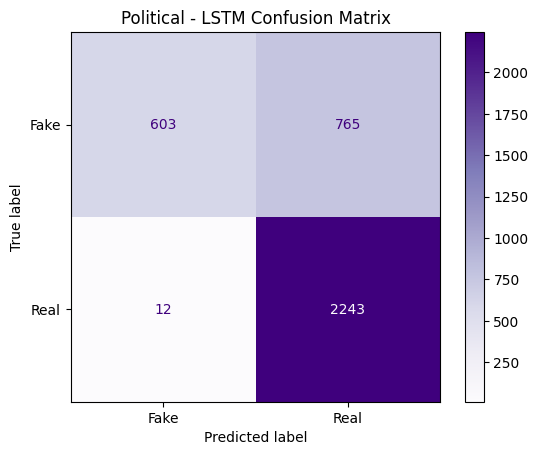

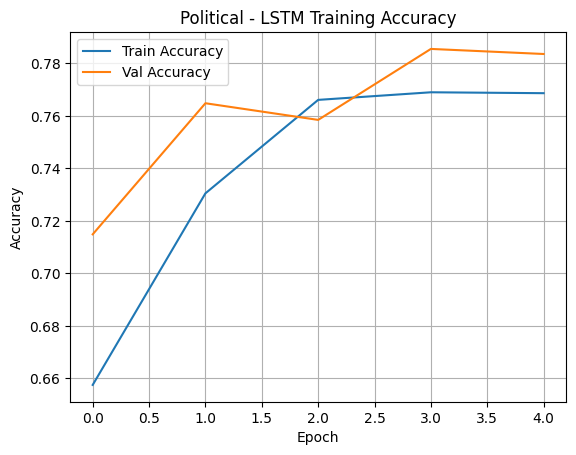


================ 🧬 Non-Political DOMAIN: LSTM ==================
Shape of padded training data: (21428, 300)
Epoch 1/5
168/168 ━━━━━━━━━━━━━━━━━━━━ 64s 372ms/step - accuracy: 0.7679 - loss: 0.4859 - val_accuracy: 0.8889 - val_loss: 0.4569
Epoch 2/5
168/168 ━━━━━━━━━━━━━━━━━━━━ 73s 438ms/step - accuracy: 0.8897 - loss: 0.3703 - val_accuracy: 0.8985 - val_loss: 0.3394
Epoch 3/5
168/168 ━━━━━━━━━━━━━━━━━━━━ 75s 445ms/step - accuracy: 0.9019 - loss: 0.3202 - val_accuracy: 0.6222 - val_loss: 0.6823
Epoch 4/5
168/168 ━━━━━━━━━━━━━━━━━━━━ 75s 447ms/step - accuracy: 0.6616 - loss: 0.6110 - val_accuracy: 0.9565 - val_loss: 0.2139
Epoch 5/5
168/168 ━━━━━━━━━━━━━━━━━━━━ 74s 442ms/step - accuracy: 0.9572 - loss: 0.1692 - val_accuracy: 0.9645 - val_loss: 0.1286
168/168 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.9659 - loss: 0.1229
LSTM Accuracy: 0.9645
168/168 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step
              precision    recall  f1-score   support

        Fake       0.95      0.99      0.97

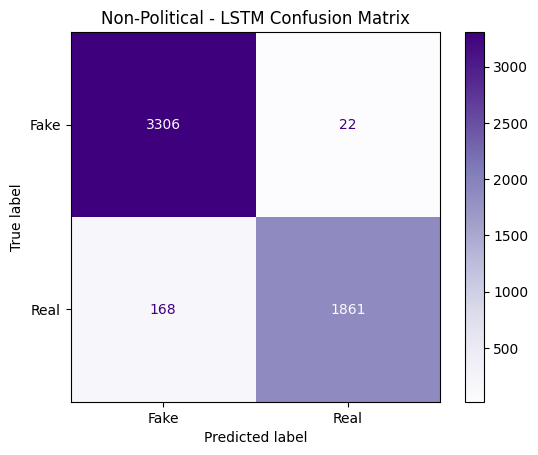

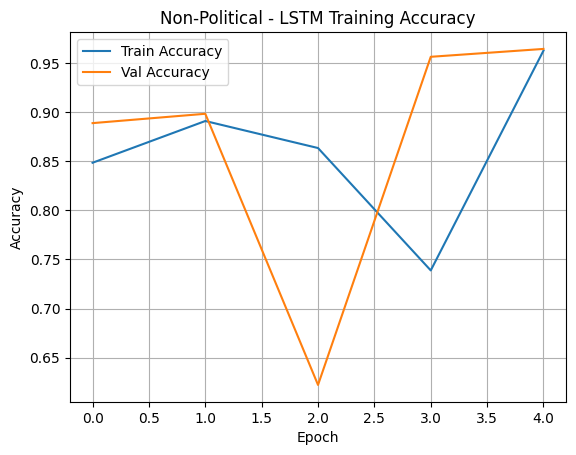

In [25]:
def run_lstm(X_train, X_test, y_train, y_test, domain_name=""):
    print(f"\n================ {domain_name} DOMAIN: LSTM ==================")

    # Tokenizer
    vocab_size = 10000
    maxlen = 300

    tokenizer = Tokenizer(num_words=vocab_size, oov_token="<OOV>")
    tokenizer.fit_on_texts(X_train)

    # Convert & pad sequences
    X_train_seq = tokenizer.texts_to_sequences(X_train)
    X_test_seq = tokenizer.texts_to_sequences(X_test)
    X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen, padding='post', truncating='post')
    X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen, padding='post', truncating='post')

    print("Shape of padded training data:", X_train_pad.shape)

    # LSTM Model
    embedding_dim = 128
    model = Sequential([
        Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=maxlen),
        LSTM(128, return_sequences=False),
        Dropout(0.5),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    early_stop = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

    history = model.fit(
        X_train_pad, y_train,
        validation_data=(X_test_pad, y_test),
        epochs=5,
        batch_size=128,
        callbacks=[early_stop],
        verbose=1
    )

    # Evaluate
    loss, acc = model.evaluate(X_test_pad, y_test)
    print(f"LSTM Accuracy: {acc:.4f}")

    # Predictions
    y_pred = (model.predict(X_test_pad) > 0.5).astype("int32")
    print(classification_report(y_test, y_pred, target_names=["Fake", "Real"]))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Fake", "Real"])
    disp.plot(cmap="Purples")
    plt.title(f"{domain_name} - LSTM Confusion Matrix")
    plt.show()

    # Accuracy Plot
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'{domain_name} - LSTM Training Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

# Political Domain
run_lstm(X_p_train, X_p_test, y_p_train, y_p_test, domain_name="Political")

# Non-Political Domain
run_lstm(X_np_train, X_np_test, y_np_train, y_np_test, domain_name="Non-Political")

### BERT

In [36]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def run_bert(X_train, y_train, X_test, y_test, domain_name=""):

    print(f"\n================ {domain_name} DOMAIN: BERT =================")

    bert_tokenizer = BertTokenizerFast.from_pretrained('bert-base-uncased')

    train_encodings = bert_tokenizer(list(X_train), truncation=True, padding=True, max_length=256)
    test_encodings = bert_tokenizer(list(X_test), truncation=True, padding=True, max_length=256)

    class FakeNewsDataset(torch.utils.data.Dataset):
        def __init__(self, encodings, labels):
            self.encodings = encodings
            self.labels = labels
        def __getitem__(self, idx):
            item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
            item['labels'] = torch.tensor(self.labels[idx])
            return item
        def __len__(self):
            return len(self.labels)

    train_dataset = FakeNewsDataset(train_encodings, list(y_train))
    test_dataset = FakeNewsDataset(test_encodings, list(y_test))

    bert_model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2).to(device)

    training_args = TrainingArguments(
        output_dir=f'./results_{domain_name.lower()}',
        num_train_epochs=2,
        per_device_train_batch_size=16,
        per_device_eval_batch_size=64,
        logging_dir=f'./logs_{domain_name.lower()}',
        logging_steps=10,
        seed=42,
        save_strategy="epoch",
        eval_strategy="epoch",
        load_best_model_at_end=True,
        metric_for_best_model="f1",
    )

    def compute_metrics(pred):
        labels = pred.label_ids
        preds = pred.predictions.argmax(-1)
        precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='binary')
        acc = accuracy_score(labels, preds)
        return {'accuracy': acc, 'precision': precision, 'recall': recall, 'f1': f1}

    bert_trainer = Trainer(
        model=bert_model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=test_dataset,
        compute_metrics=compute_metrics,
    )

    bert_trainer.train()
    eval_results = bert_trainer.evaluate()

    print(f"\n{domain_name} BERT Eval Results:")
    for key, value in eval_results.items():
        print(f"{key}: {value:.4f}")

    return bert_trainer, bert_model, bert_tokenizer

# Political Domain
political_bert_trainer, political_bert_model, political_bert_tokenizer = run_bert(
    X_p_train, y_p_train, X_p_test, y_p_test, domain_name="Political")

# Non-Political Domain
nonpolitical_bert_trainer, nonpolitical_bert_model, nonpolitical_bert_tokenizer = run_bert(
    X_np_train, y_np_train, X_np_test, y_np_test, domain_name="Non-Political")


================ 🔥 Political DOMAIN: BERT =================


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.003300,0.003613,0.999448,1.000000,0.999113,0.999556
2,0.000000,0.003012,0.999448,0.999557,0.999557,0.999557



Political BERT Eval Results:
eval_loss: 0.0030
eval_accuracy: 0.9994
eval_precision: 0.9996
eval_recall: 0.9996
eval_f1: 0.9996
eval_runtime: 32.5233
eval_samples_per_second: 111.3970
eval_steps_per_second: 1.7530
epoch: 2.0000

================ 🔥 Non-Political DOMAIN: BERT =================


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.000100,0.001826,0.999440,0.999015,0.999507,0.999261
2,0.000000,0.001049,0.999627,0.999015,1.000000,0.999507



Non-Political BERT Eval Results:
eval_loss: 0.0010
eval_accuracy: 0.9996
eval_precision: 0.9990
eval_recall: 1.0000
eval_f1: 0.9995
eval_runtime: 132.7005
eval_samples_per_second: 40.3690
eval_steps_per_second: 0.6330
epoch: 2.0000


In [55]:
# Save model
political_bert_model.save_pretrained("./saved_models/political_bert")
political_bert_tokenizer.save_pretrained("./saved_models/political_bert_tokenizer")

nonpolitical_bert_model.save_pretrained("./saved_models/nonpolitical_bert")
nonpolitical_bert_tokenizer.save_pretrained("./saved_models/nonpolitical_bert_tokenizer")

('./saved_models/nonpolitical_bert_tokenizer\\tokenizer_config.json',
 './saved_models/nonpolitical_bert_tokenizer\\special_tokens_map.json',
 './saved_models/nonpolitical_bert_tokenizer\\vocab.txt',
 './saved_models/nonpolitical_bert_tokenizer\\added_tokens.json',
 './saved_models/nonpolitical_bert_tokenizer\\tokenizer.json')

### Reload BERT

In [12]:
from transformers import BertForSequenceClassification, BertTokenizerFast
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

political_model = BertForSequenceClassification.from_pretrained("./saved_models/political_bert").to(device)
political_tokenizer = BertTokenizerFast.from_pretrained("./saved_models/political_bert_tokenizer")

political_model.config.id2label = {0: "Fake", 1: "Real"}
political_model.config.label2id = {"Fake": 0, "Real": 1}

nonpolitical_model = BertForSequenceClassification.from_pretrained("./saved_models/nonpolitical_bert").to(device)
nonpolitical_tokenizer = BertTokenizerFast.from_pretrained("./saved_models/nonpolitical_bert_tokenizer")

nonpolitical_model.config.id2label = {0: "Fake", 1: "Real"}
nonpolitical_model.config.label2id = {"Fake": 0, "Real": 1}


===== Evaluation Report: Political Domain BERT =====
              precision    recall  f1-score   support

        Fake     0.9993    0.9993    0.9993      1368
        Real     0.9996    0.9996    0.9996      2255

    accuracy                         0.9994      3623
   macro avg     0.9994    0.9994    0.9994      3623
weighted avg     0.9994    0.9994    0.9994      3623



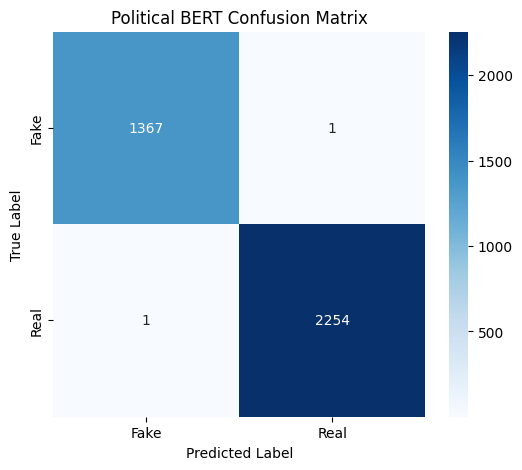


===== Evaluation Report: Non-Political Domain BERT =====
              precision    recall  f1-score   support

        Fake     1.0000    0.9994    0.9997      3328
        Real     0.9990    1.0000    0.9995      2029

    accuracy                         0.9996      5357
   macro avg     0.9995    0.9997    0.9996      5357
weighted avg     0.9996    0.9996    0.9996      5357



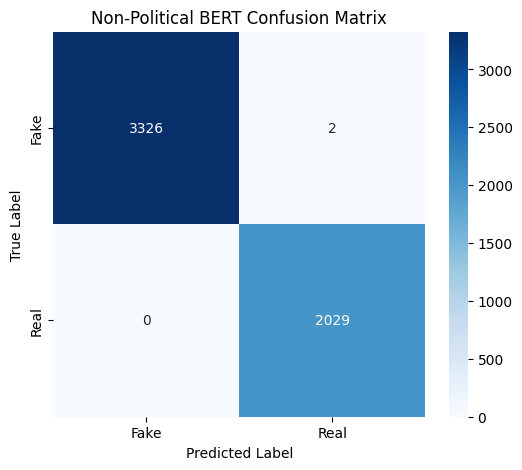

In [19]:
from torch.utils.data import TensorDataset, DataLoader

def evaluate_bert_batched(model, tokenizer, X_test, y_test, name="Domain", batch_size=16):
    model.eval()
    y_true_all = []
    y_pred_all = []

    encodings = tokenizer(list(X_test), truncation=True, padding=True, max_length=256, return_tensors="pt")
    dataset = TensorDataset(
        encodings["input_ids"],
        encodings["attention_mask"],
        torch.tensor(y_test.values)
    )
    dataloader = DataLoader(dataset, batch_size=batch_size)

    with torch.no_grad():
        for batch in dataloader:
            input_ids, attention_mask, labels = [x.to(device) for x in batch]
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            logits = outputs.logits
            preds = torch.argmax(logits, dim=1)

            y_true_all.extend(labels.cpu().numpy())
            y_pred_all.extend(preds.cpu().numpy())

    report = classification_report(y_true_all, y_pred_all, target_names=["Fake", "Real"], digits=4)
    cm = confusion_matrix(y_true_all, y_pred_all)

    print(f"\n===== Evaluation Report: {name} Domain BERT =====")
    print(report)

    # Confusion Matrix Plot
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=["Fake", "Real"], yticklabels=["Fake", "Real"])
    plt.title(f"{name} BERT Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()
    
evaluate_bert_batched(political_model, political_tokenizer, X_p_test, y_p_test, name="Political")
evaluate_bert_batched(nonpolitical_model, nonpolitical_tokenizer, X_np_test, y_np_test, name="Non-Political")

#### Error analysis

In [24]:
import pandas as pd

def bert_misclassification_analysis(model, tokenizer, X_test, y_true, domain_name="", batch_size=16):
    print(f"\n===== Misclassification Analysis: {domain_name} DOMAIN =====")

    model.eval()
    y_pred = []
    # Tokenize and batch
    encodings = tokenizer(list(X_test), truncation=True, padding=True, max_length=256, return_tensors="pt")
    dataset = torch.utils.data.TensorDataset(encodings['input_ids'], encodings['attention_mask'])
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size)

    with torch.no_grad():
        for batch in dataloader:
            input_ids, attention_mask = [x.to(device) for x in batch]
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1)
            y_pred.extend(preds.cpu().numpy())

    y_true = y_true.reset_index(drop=True)
    results_df = pd.DataFrame({
        'text': X_test.reset_index(drop=True),
        'true_label': y_true,
        'predicted_label': y_pred
    })

    misclassified_df = results_df[results_df['true_label'] != results_df['predicted_label']]

    confused_counts = misclassified_df.groupby(['true_label', 'predicted_label']).size().reset_index(name='count')
    print("Confused Cases Breakdown:")
    print(confused_counts)

    # Show sample misclassified articles
    print("\nSample Misclassified Articles:")
    for idx, row in misclassified_df.head(5).iterrows():
        print(f"\nText: {row['text'][:300]}...")
        actual = "Real" if row['true_label'] == 1 else "Fake"
        predicted = "Real" if row['predicted_label'] == 1 else "Fake"
        print(f"Actual: {actual} | Predicted: {predicted}")

bert_misclassification_analysis(political_model, political_tokenizer, X_p_test, y_p_test, domain_name="Political")
bert_misclassification_analysis(nonpolitical_model, nonpolitical_tokenizer, X_np_test, y_np_test, domain_name="Non-Political")


===== Misclassification Analysis: Political DOMAIN =====
Confused Cases Breakdown:
   true_label  predicted_label  count
0           0                1      1
1           1                0      1

Sample Misclassified Articles:

Text: ford’s new ceo snubs president trump…will build focus in china…export to us ford will export the nextgeneration focus compact car from china to north america in rather than from mexico as earlier planned saving the company million a top executive said on tuesdayit is the first major manufacturing in...
Actual: Fake | Predicted: Real

Text: washington dc lawmakers finalize ban on public pot smoking washington washington dc’s city council on tuesday permanently banned the smoking of marijuana in public or in clubs a spokeswoman for council chairman phil mendelson said voting for a second time to approve the prohibition the council had p...
Actual: Real | Predicted: Fake

===== Misclassification Analysis: Non-Political DOMAIN =====
Confused Cases Breakdown

### DistilBERT

In [26]:
from datasets import Dataset
from transformers import DistilBertTokenizerFast, DistilBertForSequenceClassification, Trainer, TrainingArguments
import numpy as np
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

def run_distilbert(X_train, y_train, X_test, y_test, domain_name=""):
    print(f"\n================ {domain_name} DOMAIN: DistilBERT =================")

    # Prepare datasets
    train_df = pd.DataFrame({'text': X_train.reset_index(drop=True), 'label': y_train.reset_index(drop=True)})
    test_df = pd.DataFrame({'text': X_test.reset_index(drop=True), 'label': y_test.reset_index(drop=True)})
    train_ds = Dataset.from_pandas(train_df)
    test_ds = Dataset.from_pandas(test_df)

    # Tokenizer
    distilbert_tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-uncased')

    def tokenize_function(batch):
        return distilbert_tokenizer(batch['text'], padding=True, truncation=True, max_length=256)

    train_ds = train_ds.map(tokenize_function, batched=True)
    test_ds = test_ds.map(tokenize_function, batched=True)
    distilbert_model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=2)

    # Metrics
    def compute_metrics(pred):
        labels = pred.label_ids
        preds = np.argmax(pred.predictions, axis=1)
        precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='binary')
        acc = accuracy_score(labels, preds)
        return {
            'accuracy': acc,
            'f1': f1,
            'precision': precision,
            'recall': recall
        }

    training_args = TrainingArguments(
        output_dir=f"./results-distilbert-{domain_name.lower()}",
        eval_strategy="epoch",
        save_strategy="epoch",
        logging_dir=f"./logs-distilbert-{domain_name.lower()}",
        logging_strategy="epoch",
        per_device_train_batch_size=16,
        per_device_eval_batch_size=16,
        num_train_epochs=2,
        weight_decay=0.01,
        load_best_model_at_end=True,
        metric_for_best_model="f1",
        seed=42,
    )

    distilbert_trainer = Trainer(
        model=distilbert_model,
        args=training_args,
        train_dataset=train_ds,
        eval_dataset=test_ds,
        tokenizer=distilbert_tokenizer,
        compute_metrics=compute_metrics,
    )
    distilbert_trainer.train()

    # Evaluate
    eval_results = distilbert_trainer.evaluate()
    print(f"\n{domain_name} DistilBERT Eval Results:")
    for key, value in eval_results.items():
        print(f"{key}: {value:.4f}")

    return distilbert_trainer, distilbert_model, distilbert_tokenizer

# Political Domain
political_distilbert_trainer, political_distilbert_model, political_distilbert_tokenizer = run_distilbert(
    X_p_train, y_p_train, X_p_test, y_p_test, domain_name="Political"
)

# Non-Political Domain
nonpolitical_distilbert_trainer, nonpolitical_distilbert_model, nonpolitical_distilbert_tokenizer = run_distilbert(
    X_np_train, y_np_train, X_np_test, y_np_test, domain_name="Non-Political"
)


================ Political DOMAIN: DistilBERT =================


Map: 100%|█████████████████████████████████████████████████████████████████| 3623/3623 [00:04<00:00, 802.76 examples/s]
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.028100,0.000315,1.000000,1.000000,1.000000,1.000000
2,0.001800,0.000047,1.000000,1.000000,1.000000,1.000000



Political DistilBERT Eval Results:
eval_loss: 0.0003
eval_accuracy: 1.0000
eval_f1: 1.0000
eval_precision: 1.0000
eval_recall: 1.0000
eval_runtime: 18.0772
eval_samples_per_second: 200.4180
eval_steps_per_second: 12.5570
epoch: 2.0000

================ Non-Political DOMAIN: DistilBERT =================


Map: 100%|█████████████████████████████████████████████████████████████████| 5357/5357 [00:06<00:00, 792.69 examples/s]
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.023400,0.005783,0.999067,0.998768,0.999014,0.998521
2,0.002000,0.002944,0.999440,0.999260,1.000000,0.998521



Non-Political DistilBERT Eval Results:
eval_loss: 0.0029
eval_accuracy: 0.9994
eval_f1: 0.9993
eval_precision: 1.0000
eval_recall: 0.9985
eval_runtime: 26.6136
eval_samples_per_second: 201.2880
eval_steps_per_second: 12.5880
epoch: 2.0000


In [28]:
# Save model
political_distilbert_model.save_pretrained("./saved_models/political_distilbert")
political_distilbert_tokenizer.save_pretrained("./saved_models/political_distilbert_tokenizer")

nonpolitical_distilbert_model.save_pretrained("./saved_models/nonpolitical_distilbert")
nonpolitical_distilbert_tokenizer.save_pretrained("./saved_models/nonpolitical_distilbert_tokenizer")

('./saved_models/nonpolitical_distilbert_tokenizer\\tokenizer_config.json',
 './saved_models/nonpolitical_distilbert_tokenizer\\special_tokens_map.json',
 './saved_models/nonpolitical_distilbert_tokenizer\\vocab.txt',
 './saved_models/nonpolitical_distilbert_tokenizer\\added_tokens.json',
 './saved_models/nonpolitical_distilbert_tokenizer\\tokenizer.json')

### Reload DistilBERT

In [45]:
from transformers import DistilBertForSequenceClassification, DistilBertTokenizerFast
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Political DistilBERT
political_distilbert_model = DistilBertForSequenceClassification.from_pretrained("./saved_models/political_distilbert").to(device)
political_distilbert_tokenizer = DistilBertTokenizerFast.from_pretrained("./saved_models/political_distilbert_tokenizer")
political_distilbert_model.config.id2label = {0: "Fake", 1: "Real"}
political_distilbert_model.config.label2id = {"Fake": 0, "Real": 1}

# Non-Political DistilBERT
nonpolitical_distilbert_model = DistilBertForSequenceClassification.from_pretrained("./saved_models/nonpolitical_distilbert").to(device)
nonpolitical_distilbert_tokenizer = DistilBertTokenizerFast.from_pretrained("./saved_models/nonpolitical_distilbert_tokenizer")
nonpolitical_distilbert_model.config.id2label = {0: "Fake", 1: "Real"}
nonpolitical_distilbert_model.config.label2id = {"Fake": 0, "Real": 1}


Political DistilBERT Accuracy: 1.0000
              precision    recall  f1-score   support

        Fake       1.00      1.00      1.00      1368
        Real       1.00      1.00      1.00      2255

    accuracy                           1.00      3623
   macro avg       1.00      1.00      1.00      3623
weighted avg       1.00      1.00      1.00      3623



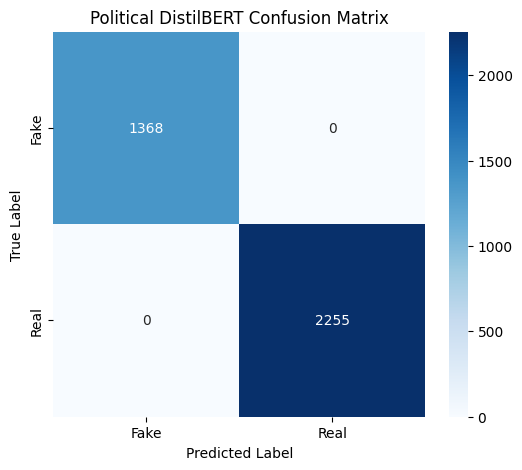


Non-Political DistilBERT Accuracy: 0.9994
              precision    recall  f1-score   support

        Fake       1.00      1.00      1.00      3328
        Real       1.00      1.00      1.00      2029

    accuracy                           1.00      5357
   macro avg       1.00      1.00      1.00      5357
weighted avg       1.00      1.00      1.00      5357



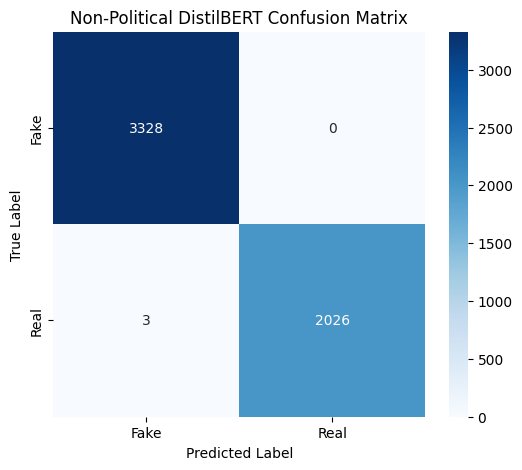

In [32]:
import numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_distilbert(model, tokenizer, X_test, y_test, name="", batch_size=16):
    model.eval()
    y_pred = []

    encodings = tokenizer(list(X_test), truncation=True, padding=True, max_length=256, return_tensors="pt")
    dataset = torch.utils.data.TensorDataset(encodings['input_ids'], encodings['attention_mask'])
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size)

    with torch.no_grad():
        for batch in dataloader:
            input_ids, attention_mask = [x.to(device) for x in batch]
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1)
            y_pred.extend(preds.cpu().numpy())

    y_test = y_test.reset_index(drop=True)

    acc = accuracy_score(y_test, y_pred)
    print(f"\n{name} DistilBERT Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred, target_names=["Fake", "Real"]))

    # Confusion matrix plot
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Fake", "Real"], yticklabels=["Fake", "Real"])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'{name} DistilBERT Confusion Matrix')
    plt.show()
    return y_pred

y_pred_political = evaluate_distilbert(political_distilbert_model, political_distilbert_tokenizer, X_p_test, y_p_test, name="Political")
y_pred_nonpolitical = evaluate_distilbert(nonpolitical_distilbert_model, nonpolitical_distilbert_tokenizer, X_np_test, y_np_test, name="Non-Political")

#### Error analysis

In [33]:
import pandas as pd

def distilbert_misclassification_analysis(X_test, y_true, y_pred, domain_name=""):
    print(f"\n===== Misclassification Analysis: {domain_name} DOMAIN =====")

    results_df = pd.DataFrame({
        'text': X_test.reset_index(drop=True),
        'true_label': y_true.reset_index(drop=True),
        'predicted_label': y_pred
    })
    # Filter misclassified samples
    misclassified_df = results_df[results_df['true_label'] != results_df['predicted_label']]

    # Breakdown of misclassifications
    confused_counts = misclassified_df.groupby(['true_label', 'predicted_label']).size().reset_index(name='count')
    print("Confused Cases Breakdown:")
    print(confused_counts)

    # Show misclassified article snippets
    print("\nSample Misclassified Articles:")
    for idx, row in misclassified_df.head(5).iterrows():
        actual = "Real" if row['true_label'] == 1 else "Fake"
        predicted = "Real" if row['predicted_label'] == 1 else "Fake"
        print(f"\nText Snippet: {row['text'][:300]}...")
        print(f"Actual: {actual} | Predicted: {predicted}")

distilbert_misclassification_analysis(X_p_test, y_p_test, y_pred_political, domain_name="Political")
distilbert_misclassification_analysis(X_np_test, y_np_test, y_pred_nonpolitical, domain_name="Non-Political")


===== Misclassification Analysis: Political DOMAIN =====
Confused Cases Breakdown:
Empty DataFrame
Columns: [true_label, predicted_label, count]
Index: []

Sample Misclassified Articles:

===== Misclassification Analysis: Non-Political DOMAIN =====
Confused Cases Breakdown:
   true_label  predicted_label  count
0           1                0      3

Sample Misclassified Articles:

Text Snippet: awaiting trumps coal comeback miners reject retraining waynesburg pa when mike sylvester entered a career training center earlier this year in southwestern pennsylvania he found more than one hundred federally funded courses covering everything from computer programming to nursing he settled instead...
Actual: Real | Predicted: Fake

Text Snippet: family of australian woman fatally shot wants minnesota cop charged the family of an australian woman who was fatally shot wants the minneapolis policeman involved charged their attorney said on tuesday the same day investigators sent the evidence col

### RoBERTa

In [39]:
def run_roberta(X_train, y_train, X_test, y_test, domain_name=""):
    print(f"\n================ {domain_name} DOMAIN: RoBERTa =================")

    train_df = pd.DataFrame({'text': X_train.reset_index(drop=True), 'label': y_train.reset_index(drop=True).astype(int)})
    test_df  = pd.DataFrame({'text': X_test.reset_index(drop=True),  'label': y_test.reset_index(drop=True).astype(int)})
    train_ds = Dataset.from_pandas(train_df)
    test_ds  = Dataset.from_pandas(test_df)
    roberta_tokenizer = RobertaTokenizerFast.from_pretrained("roberta-base")

    def tokenize_fn(batch):
        return roberta_tokenizer(batch["text"], padding=True, truncation=True, max_length=256)

    train_ds = train_ds.map(tokenize_fn, batched=True)
    test_ds  = test_ds.map(tokenize_fn,  batched=True)
    # Label mapping
    label2id = {"Fake News": 0, "Real News": 1}
    id2label = {0: "Fake News", 1: "Real News"}

    # Model initialization
    roberta_model = RobertaForSequenceClassification.from_pretrained(
        "roberta-base",
        num_labels=2,
        id2label=id2label,
        label2id=label2id
    )
    # Metrics function
    def compute_metrics(pred):
        labels = pred.label_ids
        preds  = np.argmax(pred.predictions, axis=1)
        precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average="binary")
        acc = accuracy_score(labels, preds)
        return {"accuracy": acc, "f1": f1, "precision": precision, "recall": recall}
        
    fp16_flag = torch.cuda.is_available()
    training_args = TrainingArguments(
        output_dir=f"./results-roberta-{domain_name.lower()}",
        eval_strategy="epoch",
        save_strategy="epoch",
        logging_dir=f"./logs-roberta-{domain_name.lower()}",
        logging_strategy="epoch",
        per_device_train_batch_size=16,
        per_device_eval_batch_size=16,
        num_train_epochs=2,
        weight_decay=0.01,
        load_best_model_at_end=True,
        metric_for_best_model="f1",
        fp16=fp16_flag,
        seed=42,
    )

    roberta_trainer = Trainer(
        model=roberta_model,
        args=training_args,
        train_dataset=train_ds,
        eval_dataset=test_ds,
        tokenizer=roberta_tokenizer,
        compute_metrics=compute_metrics
    )

    roberta_trainer.train()

    # Final evaluation
    eval_results = roberta_trainer.evaluate()
    print(f"\n{domain_name} RoBERTa Evaluation Results:")
    for key, value in eval_results.items():
        print(f"{key}: {value:.4f}")

    return roberta_trainer, roberta_model, roberta_tokenizer

political_roberta_trainer, political_roberta_model, political_roberta_tokenizer = run_roberta(
    X_p_train, y_p_train, X_p_test, y_p_test, domain_name="Political"
)

nonpolitical_roberta_trainer, nonpolitical_roberta_model, nonpolitical_roberta_tokenizer = run_roberta(
    X_np_train, y_np_train, X_np_test, y_np_test, domain_name="Non-Political"
)


================ Political DOMAIN: RoBERTa =================


Map: 100%|████████████████████████████████████████████████████████████████| 3623/3623 [00:03<00:00, 1036.88 examples/s]
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.028700,0.013212,0.997792,0.998229,0.996465,1.000000
2,0.003200,0.000531,0.999724,0.999778,0.999557,1.000000



Political RoBERTa Evaluation Results:
eval_loss: 0.0005
eval_accuracy: 0.9997
eval_f1: 0.9998
eval_precision: 0.9996
eval_recall: 1.0000
eval_runtime: 13.1041
eval_samples_per_second: 276.4780
eval_steps_per_second: 17.3230
epoch: 2.0000

================ Non-Political DOMAIN: RoBERTa =================


Map: 100%|████████████████████████████████████████████████████████████████| 5357/5357 [00:04<00:00, 1259.47 examples/s]
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.107400,0.062753,0.988800,0.985030,0.997473,0.972893
2,0.028500,0.013072,0.997760,0.997043,0.997043,0.997043



Non-Political RoBERTa Evaluation Results:
eval_loss: 0.0131
eval_accuracy: 0.9978
eval_f1: 0.9970
eval_precision: 0.9970
eval_recall: 0.9970
eval_runtime: 238.5545
eval_samples_per_second: 22.4560
eval_steps_per_second: 1.4040
epoch: 2.0000


In [48]:
# Save model
political_roberta_model.save_pretrained("./saved_models/political_roberta")
political_roberta_tokenizer.save_pretrained("./saved_models/political_roberta_tokenizer")

nonpolitical_roberta_model.save_pretrained("./saved_models/nonpolitical_roberta")
nonpolitical_roberta_tokenizer.save_pretrained("./saved_models/nonpolitical_roberta_tokenizer")

('./saved_models/nonpolitical_roberta_tokenizer\\tokenizer_config.json',
 './saved_models/nonpolitical_roberta_tokenizer\\special_tokens_map.json',
 './saved_models/nonpolitical_roberta_tokenizer\\vocab.json',
 './saved_models/nonpolitical_roberta_tokenizer\\merges.txt',
 './saved_models/nonpolitical_roberta_tokenizer\\added_tokens.json',
 './saved_models/nonpolitical_roberta_tokenizer\\tokenizer.json')

### Reload RoBERTa

In [50]:
from transformers import RobertaForSequenceClassification, RobertaTokenizerFast
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Reload Political RoBERTa
political_roberta_model = RobertaForSequenceClassification.from_pretrained("./saved_models/political_roberta").to(device)
political_roberta_tokenizer = RobertaTokenizerFast.from_pretrained("./saved_models/political_roberta_tokenizer")
political_roberta_model.config.id2label = {0: "Fake", 1: "Real"}
political_roberta_model.config.label2id = {"Fake": 0, "Real": 1}

# Reload Non-Political RoBERTa
nonpolitical_roberta_model = RobertaForSequenceClassification.from_pretrained("./saved_models/nonpolitical_roberta").to(device)
nonpolitical_roberta_tokenizer = RobertaTokenizerFast.from_pretrained("./saved_models/nonpolitical_roberta_tokenizer")
nonpolitical_roberta_model.config.id2label = {0: "Fake", 1: "Real"}
nonpolitical_roberta_model.config.label2id = {"Fake": 0, "Real": 1}


=== Political RoBERTa Evaluation ===
              precision    recall  f1-score   support

        Fake       1.00      1.00      1.00      1368
        Real       1.00      1.00      1.00      2255

    accuracy                           1.00      3623
   macro avg       1.00      1.00      1.00      3623
weighted avg       1.00      1.00      1.00      3623

Accuracy: 0.9997239856472536


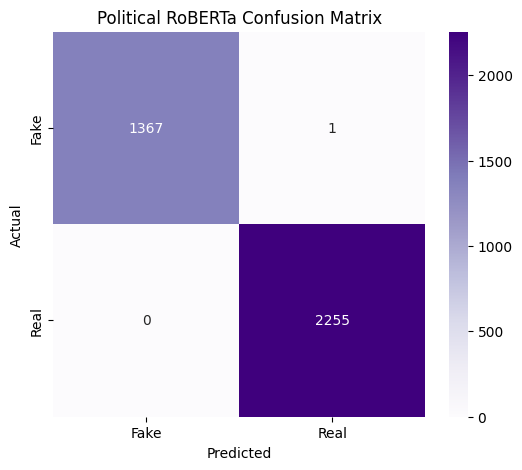


=== Non-Political RoBERTa Evaluation ===
              precision    recall  f1-score   support

        Fake       1.00      1.00      1.00      3328
        Real       1.00      1.00      1.00      2029

    accuracy                           1.00      5357
   macro avg       1.00      1.00      1.00      5357
weighted avg       1.00      1.00      1.00      5357

Accuracy: 0.9977599402650738


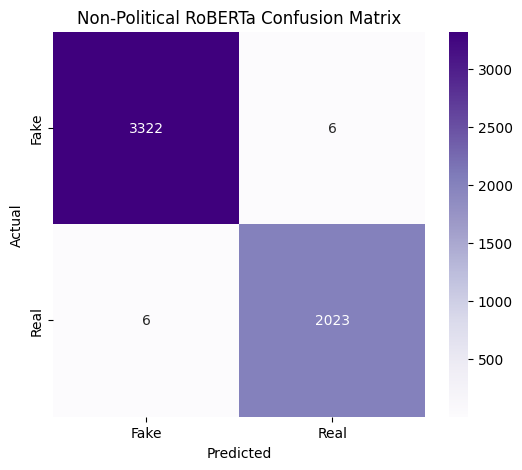

In [62]:
from datasets import Dataset
import numpy as np

def prepare_eval_dataset(texts, labels, tokenizer):
    encodings = tokenizer(texts.tolist(), truncation=True, padding=True, max_length=256)
    return Dataset.from_dict({
        'input_ids': encodings['input_ids'],
        'attention_mask': encodings['attention_mask'],
        'labels': labels.tolist()
    })
from transformers import Trainer

def evaluate_with_trainer(model, tokenizer, X_test, y_test, domain_name=""):
    eval_dataset = prepare_eval_dataset(X_test, y_test, tokenizer)

    trainer = Trainer(model=model)
    predictions = trainer.predict(eval_dataset)
    y_pred = np.argmax(predictions.predictions, axis=1)
    print(f"\n=== {domain_name} RoBERTa Evaluation ===")
    print(classification_report(y_test, y_pred, target_names=["Fake", "Real"]))
    print("Accuracy:", accuracy_score(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Purples',
                xticklabels=["Fake", "Real"],
                yticklabels=["Fake", "Real"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{domain_name} RoBERTa Confusion Matrix")
    plt.show()
    return y_pred
    
# Political RoBERTa
y_pred_political_roberta = evaluate_with_trainer(
    political_roberta_model, political_roberta_tokenizer,
    X_p_test, y_p_test, domain_name="Political"
)
# Non-Political RoBERTa
y_pred_nonpolitical_roberta = evaluate_with_trainer(
    nonpolitical_roberta_model, nonpolitical_roberta_tokenizer,
    X_np_test, y_np_test, domain_name="Non-Political"
)

#### Error anlysis

In [63]:
def roberta_misclassification_analysis(X_test, y_true, y_pred, domain_name=""):
    print(f"\n===== Misclassification Analysis: {domain_name} DOMAIN =====")

    results_df = pd.DataFrame({
        'text': X_test.reset_index(drop=True),
        'true_label': y_true.reset_index(drop=True),
        'predicted_label': y_pred
    })

    misclassified_df = results_df[results_df['true_label'] != results_df['predicted_label']]
    confused_counts = misclassified_df.groupby(['true_label', 'predicted_label']).size().reset_index(name='count')
    print("Confused Cases Breakdown:")
    print(confused_counts)
    print("\nSample Misclassified Articles:")
    
    for idx, row in misclassified_df.head(5).iterrows():
        actual = "Real" if row['true_label'] == 1 else "Fake"
        predicted = "Real" if row['predicted_label'] == 1 else "Fake"
        print(f"\nText Snippet: {row['text'][:300]}...")
        print(f"Actual: {actual} | Predicted: {predicted}")

roberta_misclassification_analysis(X_p_test, y_p_test, y_pred_political_roberta, domain_name="Political")
roberta_misclassification_analysis(X_np_test, y_np_test, y_pred_nonpolitical_roberta, domain_name="Non-Political")


===== Misclassification Analysis: Political DOMAIN =====
Confused Cases Breakdown:
   true_label  predicted_label  count
0           0                1      1

Sample Misclassified Articles:

Text Snippet: shocking number of michigan voters want muslim ban in their state thus the big win for donald trump in blue state of michigan michigan has one of the largest muslim populations of any state yet out of republicans in the state favored a temporary ban on muslim visitors to the united states according ...
Actual: Fake | Predicted: Real

===== Misclassification Analysis: Non-Political DOMAIN =====
Confused Cases Breakdown:
   true_label  predicted_label  count
0           0                1      6
1           1                0      6

Sample Misclassified Articles:

Text Snippet: angela merkel running for reelection makes stunning announcement to ban burkas after flooding nation with million mostly muslim migrants angela merkel today completed an astonishing uturn as she formally endor

### Explainability

LR & RF

In [ ]:
import lime
import lime.lime_text
from sklearn.pipeline import make_pipeline

def explain_with_lime(model, vectorizer, X_test, index_to_explain=0, model_name="Model", domain_name=""):
    print(f"\n LIME Explanation for {model_name} on {domain_name} domain - Sample #{index_to_explain}")
    # Prepare pipeline
    pipeline = make_pipeline(vectorizer, model)
    explainer = lime.lime_text.LimeTextExplainer(class_names=["Fake", "Real"])
    # Pick instance to explain
    sample_text = X_test.iloc[index_to_explain]
    # Explain the instance
    exp = explainer.explain_instance(sample_text, pipeline.predict_proba, num_features=10)
    # Show explanation
    exp.show_in_notebook(text=sample_text)

# Political Domain LIME Explanation
explain_with_lime(lr_model_p, tfidf_p, X_p_test, index_to_explain=5, model_name="Logistic Regression", domain_name="Political")
explain_with_lime(rf_model_p, tfidf_p, X_p_test, index_to_explain=5, model_name="Random Forest", domain_name="Political")

# Non-Political Domain LIME Explanation
explain_with_lime(lr_model_np, tfidf_np, X_np_test, index_to_explain=8, model_name="Logistic Regression", domain_name="Non-Political")
explain_with_lime(rf_model_np, tfidf_np, X_np_test, index_to_explain=8, model_name="Random Forest", domain_name="Non-Political")


🔍 LIME Explanation for Logistic Regression on Political domain - Sample #5



🔍 LIME Explanation for Random Forest on Political domain - Sample #5



🔍 LIME Explanation for Logistic Regression on Non-Political domain - Sample #8



🔍 LIME Explanation for Random Forest on Non-Political domain - Sample #8


BERT

In [ ]:
import torch
import nltk
from transformers_interpret import SequenceClassificationExplainer

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def explain_bert_with_attention(model, tokenizer, text, domain_name="", max_length=512):
    try:
        torch.cuda.empty_cache()
        model_cpu = model.to('cpu')
        
        # Tokenize and truncate to max_length with padding for stable input size
        inputs = tokenizer(
            text, 
            return_tensors="pt", 
            truncation=True, 
            max_length=max_length,
            padding='max_length'
        )
        # Decode truncated tokens back to text for explainer
        decoded_text = tokenizer.decode(
            inputs['input_ids'][0], 
            skip_special_tokens=True
        )
        explainer = SequenceClassificationExplainer(
            model=model_cpu,
            tokenizer=tokenizer
        )
        word_attributions = explainer(decoded_text)
        pred_label = explainer.predicted_class_name

        print(f"\n [{domain_name}] Predicted label: {pred_label}")
        print(f" Note: Text truncated to {max_length} tokens for analysis.")
        print(" Top attributions:")
        for word, score in word_attributions[:10]:
            print(f"  {word}: {score:.4f}")

        explainer.visualize()
        
    except Exception as e:
        print(f"[{domain_name}] Error during explanation: {e}")
    finally:
        model.to(device)

def explain_long_text(model, tokenizer, text, domain_name="", chunk_size=400):
    sentences = nltk.sent_tokenize(text)
    current_chunk = []
    current_length = 0
    for sentence in sentences:
        sentence_length = len(tokenizer.tokenize(sentence))  
        if current_length + sentence_length <= chunk_size:
            current_chunk.append(sentence)
            current_length += sentence_length
        else:
            if current_chunk:  # Only explain if not empty
                chunk_text = ' '.join(current_chunk)
                print(f"\n📖 Explaining chunk ({len(current_chunk)} sentences, ~{current_length} tokens)")
                explain_bert_with_attention(model, tokenizer, chunk_text, domain_name)
            
            current_chunk = [sentence]
            current_length = sentence_length
    
    # Final chunk also check for emptiness
    if current_chunk:
        chunk_text = ' '.join(current_chunk)
        print(f"\n📖 Explaining final chunk ({len(current_chunk)} sentences, ~{current_length} tokens)")
        explain_bert_with_attention(model, tokenizer, chunk_text, domain_name)

sample_text = X_p_test.iloc[12]
explain_long_text(political_model, political_tokenizer, sample_text, domain_name="Political")



📖 Explaining final chunk (1 sentences, ~913 tokens)

🧠 [Political] Predicted label: LABEL_1
⚠️ Note: Text truncated to 512 tokens for analysis.
🕵️ Top attributions:
  [CLS]: 0.0000
  trump: 0.0234
  pop: 0.0103
  ##uli: 0.0165
  ##sm: 0.0127
  comes: 0.0067
  to: -0.0014
  canada: 0.0072
  as: -0.0114
  conservatives: 0.0006


In [ ]:
# Example usage for Non-Political domain
sample_text_np = X_np_test.iloc[12] 
explain_long_text(nonpolitical_model, nonpolitical_tokenizer, sample_text_np, domain_name="Non-Political")

Token indices sequence length is longer than the specified maximum sequence length for this model (559 > 512). Running this sequence through the model will result in indexing errors



📖 Explaining final chunk (1 sentences, ~559 tokens)

🧠 [Non-Political] Predicted label: LABEL_0
⚠️ Note: Text truncated to 512 tokens for analysis.
🕵️ Top attributions:
  [CLS]: 0.0000
  war: -0.0022
  ##on: 0.0208
  ##christ: -0.1370
  ##mas: -0.1081
  starbucks: -0.1047
  attempts: 0.0101
  to: 0.0460
  capital: 0.0448
  ##ize: 0.0890


DistilBERT

In [ ]:
from transformers_interpret import SequenceClassificationExplainer
import torch
import nltk

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def explain_distilbert_with_attention(model, tokenizer, text, domain_name="", max_length=512):
    try:
        torch.cuda.empty_cache()
        model = model.to('cpu') 

        inputs = tokenizer(
            text,
            return_tensors="pt",
            truncation=True,
            max_length=max_length,
            padding='max_length'
        )
        decoded_text = tokenizer.decode(inputs['input_ids'][0], skip_special_tokens=True)

        explainer = SequenceClassificationExplainer(
            model=model,
            tokenizer=tokenizer
        )
        word_attributions = explainer(decoded_text)
        pred_label = explainer.predicted_class_name

        print(f"\n [{domain_name}] Predicted label: {pred_label}")
        print(f" Note: Text truncated to {max_length} tokens for analysis")
        print("Top attributions:")
        for word, score in word_attributions[:10]:
            print(f"  {word}: {score:.4f}")

        explainer.visualize()

    except Exception as e:
        print(f"[{domain_name}] Error during explanation: {e}")
    finally:
        model = model.to(device) 

def explain_long_text_distilbert(model, tokenizer, text, domain_name="", chunk_size=400):
    sentences = nltk.sent_tokenize(text)
    current_chunk = []
    current_length = 0
    for sentence in sentences:
        sentence_length = len(tokenizer.tokenize(sentence))
        if current_length + sentence_length <= chunk_size:
            current_chunk.append(sentence)
            current_length += sentence_length
        else:
            chunk_text = ' '.join(current_chunk)
            print(f"\n📖 Explaining chunk ({len(current_chunk)} sentences, ~{current_length} tokens)")
            explain_distilbert_with_attention(model, tokenizer, chunk_text, domain_name)
            current_chunk = [sentence]
            current_length = sentence_length

    if current_chunk:
        chunk_text = ' '.join(current_chunk)
        print(f"\n Explaining final chunk ({len(current_chunk)} sentences, ~{current_length} tokens)")
        explain_distilbert_with_attention(model, tokenizer, chunk_text, domain_name)

# Example usage for Political DistilBERT:
sample_text_p = X_p_test.iloc[12]
explain_long_text_distilbert(political_distilbert_model, political_distilbert_tokenizer, sample_text_p, domain_name="Political")

# Example usage for Non-Political DistilBERT:
sample_text_np = X_np_test.iloc[12]
explain_long_text_distilbert(nonpolitical_distilbert_model, nonpolitical_distilbert_tokenizer, sample_text_np, domain_name="Non-Political")

Token indices sequence length is longer than the specified maximum sequence length for this model (913 > 512). Running this sequence through the model will result in indexing errors



📖 Explaining chunk (0 sentences, ~0 tokens)

🧠 [Political] Predicted label: Fake
⚠️ Note: Text truncated to 512 tokens for analysis
🕵️ Top attributions:
  [CLS]: nan
  [SEP]: nan


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
0,Fake (1.00),Fake,nan,[CLS] [SEP]



📖 Explaining final chunk (1 sentences, ~913 tokens)

🧠 [Political] Predicted label: Real
⚠️ Note: Text truncated to 512 tokens for analysis
🕵️ Top attributions:
  [CLS]: 0.0000
  trump: 0.0020
  pop: 0.0050
  ##uli: 0.0129
  ##sm: 0.0045
  comes: 0.0029
  to: 0.0441
  canada: 0.0813
  as: 0.0183
  conservatives: 0.0019


Token indices sequence length is longer than the specified maximum sequence length for this model (559 > 512). Running this sequence through the model will result in indexing errors



📖 Explaining chunk (0 sentences, ~0 tokens)

🧠 [Non-Political] Predicted label: Fake
⚠️ Note: Text truncated to 512 tokens for analysis
🕵️ Top attributions:
  [CLS]: nan
  [SEP]: nan


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
0,Fake (1.00),Fake,nan,[CLS] [SEP]



📖 Explaining final chunk (1 sentences, ~559 tokens)

🧠 [Non-Political] Predicted label: Fake
⚠️ Note: Text truncated to 512 tokens for analysis
🕵️ Top attributions:
  [CLS]: 0.0000
  war: 0.0163
  ##on: 0.0081
  ##christ: -0.0037
  ##mas: -0.0136
  starbucks: -0.0021
  attempts: 0.0010
  to: -0.0013
  capital: -0.0126
  ##ize: -0.0061


RoBERTa

In [ ]:
from transformers_interpret import SequenceClassificationExplainer
import torch
import nltk

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def explain_roberta_with_attention(model, tokenizer, text, domain_name="", max_length=512):
    try:
        torch.cuda.empty_cache()
        model = model.to('cpu') 

        inputs = tokenizer(
            text,
            return_tensors="pt",
            truncation=True,
            max_length=max_length,
            padding='max_length'
        )
        decoded_text = tokenizer.decode(inputs['input_ids'][0], skip_special_tokens=True)

        explainer = SequenceClassificationExplainer(
            model=model,
            tokenizer=tokenizer
        )
        word_attributions = explainer(decoded_text)
        pred_label = explainer.predicted_class_name

        print(f"\n [{domain_name}] Predicted label: {pred_label}")
        print(f" Note: Text truncated to {max_length} tokens for analysis")
        print("Top attributions:")
        for word, score in word_attributions[:10]:
            print(f"  {word}: {score:.4f}")

        explainer.visualize()

    except Exception as e:
        print(f"🚨 [{domain_name}] Error during explanation: {e}")
    finally:
        model = model.to(device) 

def explain_long_text_roberta(model, tokenizer, text, domain_name="", chunk_size=400):
    sentences = nltk.sent_tokenize(text)
    current_chunk = []
    current_length = 0
    for sentence in sentences:
        sentence_length = len(tokenizer.tokenize(sentence))
        if current_length + sentence_length <= chunk_size:
            current_chunk.append(sentence)
            current_length += sentence_length
        else:
            chunk_text = ' '.join(current_chunk)
            print(f"\n📖 Explaining chunk ({len(current_chunk)} sentences, ~{current_length} tokens)")
            explain_roberta_with_attention(model, tokenizer, chunk_text, domain_name)
            current_chunk = [sentence]
            current_length = sentence_length

    if current_chunk:
        chunk_text = ' '.join(current_chunk)
        print(f"\n Explaining final chunk ({len(current_chunk)} sentences, ~{current_length} tokens)")
        explain_roberta_with_attention(model, tokenizer, chunk_text, domain_name)

# Example usage - Political
sample_text_p = X_p_test.iloc[12]
explain_long_text_roberta(political_roberta_model, political_roberta_tokenizer, sample_text_p, domain_name="Political")

# Example usage - Non-Political
sample_text_np = X_np_test.iloc[12]
explain_long_text_roberta(nonpolitical_roberta_model, nonpolitical_roberta_tokenizer, sample_text_np, domain_name="Non-Political")

Token indices sequence length is longer than the specified maximum sequence length for this model (985 > 512). Running this sequence through the model will result in indexing errors



📖 Explaining chunk (0 sentences, ~0 tokens)

🧠 [Political] Predicted label: Fake
⚠️ Note: Text truncated to 512 tokens for analysis
🕵️ Top attributions:
  <s>: nan
  </s>: nan


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
0,Fake (0.98),Fake,nan,#s #/s



📖 Explaining final chunk (1 sentences, ~985 tokens)

🧠 [Political] Predicted label: Real
⚠️ Note: Text truncated to 512 tokens for analysis
🕵️ Top attributions:
  <s>: 0.0000
  trump: 0.0115
  populism: 0.0012
  comes: 0.0027
  to: 0.0035
  can: 0.0101
  ada: -0.0027
  as: 0.0114
  conservatives: 0.0006
  seek: 0.0084


Token indices sequence length is longer than the specified maximum sequence length for this model (593 > 512). Running this sequence through the model will result in indexing errors



📖 Explaining chunk (0 sentences, ~0 tokens)

🧠 [Non-Political] Predicted label: Fake
⚠️ Note: Text truncated to 512 tokens for analysis
🕵️ Top attributions:
  <s>: nan
  </s>: nan


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
0,Fake (1.00),Fake,nan,#s #/s



📖 Explaining final chunk (1 sentences, ~593 tokens)

🧠 [Non-Political] Predicted label: Fake
⚠️ Note: Text truncated to 512 tokens for analysis
🕵️ Top attributions:
  <s>: 0.0000
  war: 0.1207
  on: 0.0712
  christ: 0.0779
  mas: 0.1953
  star: 0.0103
  bucks: 0.2026
  attempts: 0.0908
  to: 0.0014
  capitalize: -0.0177


### ENSEMBLE


===== Ensemble Evaluation: Political DOMAIN =====
Accuracy: 1.0000

              precision    recall  f1-score   support

        Fake       1.00      1.00      1.00      1368
        Real       1.00      1.00      1.00      2255

    accuracy                           1.00      3623
   macro avg       1.00      1.00      1.00      3623
weighted avg       1.00      1.00      1.00      3623



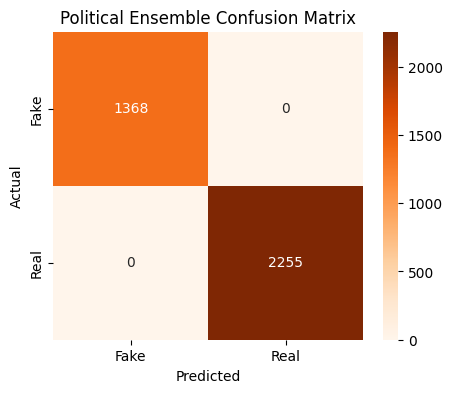


===== Ensemble Evaluation: Non-Political DOMAIN =====
Accuracy: 0.9998

              precision    recall  f1-score   support

        Fake       1.00      1.00      1.00      3328
        Real       1.00      1.00      1.00      2029

    accuracy                           1.00      5357
   macro avg       1.00      1.00      1.00      5357
weighted avg       1.00      1.00      1.00      5357



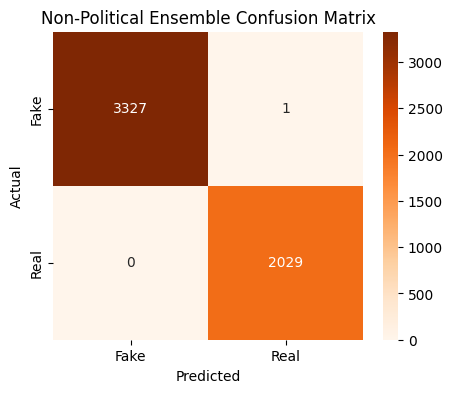

In [55]:
import numpy as np
import torch
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# get model probabilities in batches 
def get_probs(model, tokenizer, texts, batch_size=32, max_length=256):
    model.eval()
    probs = []
    encodings = tokenizer(texts.tolist(),
                          truncation=True,
                          padding=True,
                          max_length=max_length,
                          return_tensors="pt")
    dataset = TensorDataset(encodings["input_ids"], encodings["attention_mask"])
    loader = DataLoader(dataset, batch_size=batch_size)   
    with torch.no_grad():
        for input_ids, attention_mask in loader:
            input_ids = input_ids.to(device)
            attention_mask = attention_mask.to(device)
            logits = model(input_ids=input_ids, attention_mask=attention_mask).logits
            batch_probs = torch.softmax(logits, dim=1).cpu().numpy()
            probs.append(batch_probs)
    
    return np.vstack(probs)

# Get each model’s probabilities on a test set    
# Political domain
texts_p = X_p_test
y_p = y_p_test.values
probs_p_bert = get_probs(political_model, political_tokenizer, texts_p)
probs_p_distil = get_probs(political_distilbert_model, political_distilbert_tokenizer, texts_p)
probs_p_roberta = get_probs(political_roberta_model,  political_roberta_tokenizer,   texts_p)

# Non-Political domain
texts_np = X_np_test
y_np = y_np_test.values

probs_np_bert = get_probs(nonpolitical_model, nonpolitical_tokenizer, texts_np)
probs_np_distil = get_probs(nonpolitical_distilbert_model, nonpolitical_distilbert_tokenizer, texts_np)
probs_np_roberta = get_probs(nonpolitical_roberta_model, nonpolitical_roberta_tokenizer,   texts_np)

# Ensemble by averaging probabilities
def ensemble_predict(probs_list):
    avg = np.mean(probs_list, axis=0)
    return np.argmax(avg, axis=1)

y_pred_p_ens   = ensemble_predict([probs_p_bert, probs_p_distil, probs_p_roberta])
y_pred_np_ens  = ensemble_predict([probs_np_bert, probs_np_distil, probs_np_roberta])

# Evaluate & plot confusion matrix 
def evaluate_and_plot(y_true, y_pred, domain_name=""):
    print(f"\n===== Ensemble Evaluation: {domain_name} DOMAIN =====")
    print(f"Accuracy: {accuracy_score(y_true, y_pred):.4f}\n")
    print(classification_report(y_true, y_pred, target_names=["Fake", "Real"]))   
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap="Oranges",
                xticklabels=["Fake","Real"], yticklabels=["Fake","Real"])
    plt.title(f"{domain_name} Ensemble Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

# Political
evaluate_and_plot(y_p,  y_pred_p_ens,  domain_name="Political")

# Non-Political
evaluate_and_plot(y_np, y_pred_np_ens, domain_name="Non-Political")

In [ ]:
import pandas as pd

# Political
misclassified_p_idx = np.where(y_pred_p_ens != y_p)[0]
misclassified_p = pd.DataFrame({
    'text': texts_p.iloc[misclassified_p_idx],
    'true_label': y_p[misclassified_p_idx],
    'predicted_label': y_pred_p_ens[misclassified_p_idx]
})
# Non-Political
misclassified_np_idx = np.where(y_pred_np_ens != y_np)[0]
misclassified_np = pd.DataFrame({
    'text': texts_np.iloc[misclassified_np_idx],
    'true_label': y_np[misclassified_np_idx],
    'predicted_label': y_pred_np_ens[misclassified_np_idx]
})
print(f"\n Misclassified in Political: {len(misclassified_p)}")
print(f"Misclassified in Non-Political: {len(misclassified_np)}")


 Misclassified in Political: 0
Misclassified in Non-Political: 1


In [ ]:
from lime.lime_text import LimeTextExplainer
import numpy as np

class_names = ["Fake", "Real"]
explainer = LimeTextExplainer(class_names=class_names)
def ensemble_predict_proba(texts, domain="political"):
    probs = []
    for text in texts:
        if domain == "political":
            inputs1 = political_tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=256).to(device)
            p1 = torch.softmax(political_model(**inputs1).logits, dim=1).cpu().detach().numpy()
            
            inputs2 = political_distilbert_tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=256).to(device)
            p2 = torch.softmax(political_distilbert_model(**inputs2).logits, dim=1).cpu().detach().numpy()
            
            inputs3 = political_roberta_tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=256).to(device)
            p3 = torch.softmax(political_roberta_model(**inputs3).logits, dim=1).cpu().detach().numpy()
        else:
            inputs1 = nonpolitical_tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=256).to(device)
            p1 = torch.softmax(nonpolitical_model(**inputs1).logits, dim=1).cpu().detach().numpy()
            
            inputs2 = nonpolitical_distilbert_tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=256).to(device)
            p2 = torch.softmax(nonpolitical_distilbert_model(**inputs2).logits, dim=1).cpu().detach().numpy()
            
            inputs3 = nonpolitical_roberta_tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=256).to(device)
            p3 = torch.softmax(nonpolitical_roberta_model(**inputs3).logits, dim=1).cpu().detach().numpy()
        
        avg_prob = np.mean([p1, p2, p3], axis=0)
        probs.append(avg_prob[0])
    
    return np.array(probs)

# Get predictions for the political domain
texts_political = df_political_cleaned['cleaned'].tolist()
probs_p = ensemble_predict_proba(texts_political, domain="political")
predicted_labels_p = np.argmax(probs_p, axis=1)
correct_political = df_political_cleaned[predicted_labels_p == df_political_cleaned['label']].reset_index(drop=True)
sample_text = correct_political.iloc[0]['cleaned']  
sample_true_label = correct_political.iloc[0]['label']
sample_pred_label = predicted_labels_p[correct_political.index[0]]
print(f"Sample Text (truncated):\n{sample_text[:500]}...\n")
print(f"True Label: {class_names[sample_true_label]}")
print(f"Predicted Label: {class_names[sample_pred_label]}")

# Run LIME explanation on the sample
exp = explainer.explain_instance(
    sample_text, 
    lambda x: ensemble_predict_proba(x, domain="political"), 
    num_features=10, 
    top_labels=1
)
exp.show_in_notebook(text=sample_text)

Sample Text (truncated):
house bill aims to identify lawmakers in sex harassment cases washington a bipartisan group of lawmakers in the us house of representatives on wednesday introduced legislation requiring the disclosure of sexual harassment case settlements involving members of congress and their staffers the move came amid a snowballing number of revelations about harassment of coworkers and others by members of congress as well as highprofile entertainment and media figures’ being accused of workplace impropriet...

True Label: Real
Predicted Label: Real


### Interface

In [ ]:
def text_analysis_dashboard():
    print("\n" + "="*60)
    print(" NEWS AUTHENTICITY ANALYZER ".center(60))
    print("="*60 + "\n")
    
    while True:
        article = input(" Paste the news article (or type 'quit' to exit):\n")
        if article.lower() == 'quit':
            print(" Farewell, explorer.")
            break
            
        domain = input("\nIs this article Political or Non-Political? (P/NP): ").strip().lower()
        while domain not in ['p', 'np']:
            print("Please enter 'P' for Political or 'NP' for Non-Political")
            domain = input("Political or Non-Political? (P/NP): ").strip().lower()
            
        domain_key = 'political' if domain == 'p' else 'nonpolitical'
        domain_name = "Political" if domain_key == 'political' else "Non-Political"
        
        print(f"\n Analyzing {domain_name} article...\n")
        
        results = []

        # 1. Logistic Regression
        if domain_key == 'political':
            lr_proba = lr_model_p.predict_proba(tfidf_p.transform([article]))[0]
        else:
            lr_proba = lr_model_np.predict_proba(tfidf_np.transform([article]))[0]
        
        lr_pred = np.argmax(lr_proba)
        results.append(("Logistic Regression", "Fake" if lr_pred == 0 else "Real", f"{max(lr_proba)*100:.1f}%"))

        # 2. Random Forest
        if domain_key == 'political':
            rf_proba = rf_model_p.predict_proba(tfidf_p.transform([article]))[0]
        else:
            rf_proba = rf_model_np.predict_proba(tfidf_np.transform([article]))[0]
        
        rf_pred = np.argmax(rf_proba)
        results.append(("Random Forest", "Fake" if rf_pred == 0 else "Real", f"{max(rf_proba)*100:.1f}%"))

        if domain_key == 'political':
        # 1. BERT
            inputs = political_tokenizer([article], return_tensors="pt", truncation=True, padding=True).to(device)
            outputs = political_model(**inputs)
            probs_bert = torch.softmax(outputs.logits, dim=1).detach().cpu().numpy()[0]
            pred_bert = np.argmax(probs_bert)
            results.append(("BERT", "Fake" if pred_bert == 0 else "Real", f"{max(probs_bert)*100:.1f}%"))

            # 2. DistilBERT
            inputs = political_distilbert_tokenizer([article], return_tensors="pt", truncation=True, padding=True).to(device)
            outputs = political_distilbert_model(**inputs)
            probs_distil = torch.softmax(outputs.logits, dim=1).detach().cpu().numpy()[0]
            pred_distil = np.argmax(probs_distil)
            results.append(("DistilBERT", "Fake" if pred_distil == 0 else "Real", f"{max(probs_distil)*100:.1f}%"))

            # 3. RoBERTa
            inputs = political_roberta_tokenizer([article], return_tensors="pt", truncation=True, padding=True).to(device)
            outputs = political_roberta_model(**inputs)
            probs_roberta = torch.softmax(outputs.logits, dim=1).detach().cpu().numpy()[0]
            pred_roberta = np.argmax(probs_roberta)
            results.append(("RoBERTa", "Fake" if pred_roberta == 0 else "Real", f"{max(probs_roberta)*100:.1f}%"))

        else:
            # 1. BERT
            inputs = nonpolitical_tokenizer([article], return_tensors="pt", truncation=True, padding=True).to(device)
            outputs = nonpolitical_model(**inputs)
            probs_bert = torch.softmax(outputs.logits, dim=1).detach().cpu().numpy()[0]
            pred_bert = np.argmax(probs_bert)
            results.append(("BERT", "Fake" if pred_bert == 0 else "Real", f"{max(probs_bert)*100:.1f}%"))

            # 2. DistilBERT
            inputs = nonpolitical_distilbert_tokenizer([article], return_tensors="pt", truncation=True, padding=True).to(device)
            outputs = nonpolitical_distilbert_model(**inputs)
            probs_distil = torch.softmax(outputs.logits, dim=1).detach().cpu().numpy()[0]
            pred_distil = np.argmax(probs_distil)
            results.append(("DistilBERT", "Fake" if pred_distil == 0 else "Real", f"{max(probs_distil)*100:.1f}%"))

            # 3. RoBERTa
            inputs = nonpolitical_roberta_tokenizer([article], return_tensors="pt", truncation=True, padding=True).to(device)
            outputs = nonpolitical_roberta_model(**inputs)
            probs_roberta = torch.softmax(outputs.logits, dim=1).detach().cpu().numpy()[0]
            pred_roberta = np.argmax(probs_roberta)
            results.append(("RoBERTa", "Fake" if pred_roberta == 0 else "Real", f"{max(probs_roberta)*100:.1f}%"))

       # 4. Transformer Ensemble (BERT, DistilBERT, RoBERTa)
        ens_proba = ensemble_predict_proba([article], domain=domain_key)[0]
        ens_pred = np.argmax(ens_proba)
        results.append(("Ensemble (BERT/DistilBERT/RoBERTa)", "Fake" if ens_pred == 0 else "Real", f"{max(ens_proba)*100:.1f}%"))

        # Display predictions
        print("\n === PREDICTION RESULTS ===")
        print("{:<35} {:<10} {:<10}".format("Model", "Prediction", "Confidence"))
        print("-" * 60)
        for model, pred, conf in results:
            print("{:<35} {:<10} {:<10}".format(model, pred, conf))

        # Offer explanation (via LIME or TransformerInterpret)
        explain = input("\nWould you like an explanation from the Ensemble? (y/n): ").lower()
        if explain == 'y':
            print("\n Generating explanation via LIME for the Ensemble...\n")
            exp = explainer.explain_instance(
                article,
                lambda x: ensemble_predict_proba(x, domain=domain_key),
                num_features=10,
                top_labels=1
            )
            exp.show_in_notebook(text=article)

        print("\n" + "="*60 + "\n")
text_analysis_dashboard()



                 NEWS AUTHENTICITY ANALYZER                 



 Paste the news article (or type 'quit' to exit):
 Pope Francis used his annual Christmas Day message to rebuke Donald Trump without even mentioning his name. The Pope delivered his message just days after members of the United Nations condemned Trump s move to recognize Jerusalem as the capital of Israel. The Pontiff prayed on Monday for the  peaceful coexistence of two states within mutually agreed and internationally recognized borders. We see Jesus in the children of the Middle East who continue to suffer because of growing tensions between Israelis and Palestinians,  Francis said.

Is this article Political or Non-Political? (P/NP):  NP



 Analyzing Non-Political article...


 === PREDICTION RESULTS ===
Model                               Prediction Confidence
------------------------------------------------------------
Logistic Regression                 Real       60.2%     
Random Forest                       Real       58.2%     
BERT                                Fake       93.1%     
DistilBERT                          Fake       92.0%     
RoBERTa                             Real       79.4%     
Ensemble (BERT/DistilBERT/RoBERTa)  Fake       68.5%     



Would you like an explanation from the Ensemble? (y/n):  y



 Generating explanation via LIME for the Ensemble...



 Paste the news article (or type 'quit' to exit):
 quit


 Farewell, explorer.
